In [1]:
!pip install torch torchsr torchvision tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.8 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 74.2 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found existing installation: nvidia-curand-cu12 10.3.10.19
    Uninstalling nvidia-curand-cu12-

In [2]:
import os

# Move to /kaggle directory
os.chdir("/kaggle")

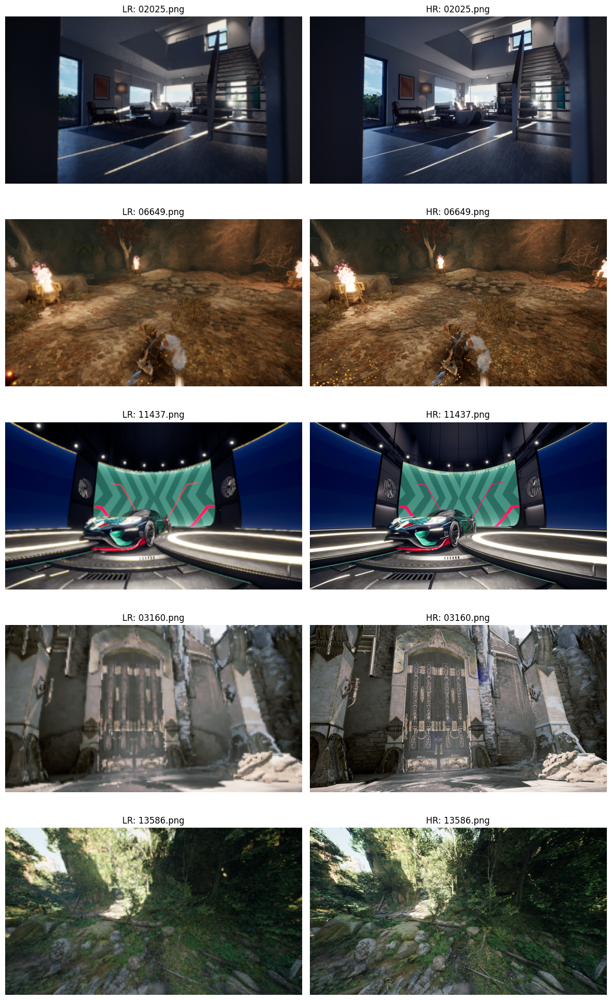

In [3]:
import cv2
import os
import random
import matplotlib.pyplot as plt

# Directories
lr_dir = "/kaggle/input/super-resolution-in-video-games/train/lr"
hr_dir = "/kaggle/input/super-resolution-in-video-games/train/hr"

# Number of random examples to show
num_examples = 5

# Get and shuffle filenames
lr_filenames = sorted(os.listdir(lr_dir))
sampled_filenames = random.sample(lr_filenames, num_examples)

plt.figure(figsize=(12, 4 * num_examples))

for i, fname in enumerate(sampled_filenames):
    # Load LR image
    lr_path = os.path.join(lr_dir, fname)
    lr_img = cv2.imread(lr_path)
    lr_img = cv2.cvtColor(lr_img, cv2.COLOR_BGR2RGB)

    # Load HR image
    hr_path = os.path.join(hr_dir, fname)
    hr_img = cv2.imread(hr_path)
    hr_img = cv2.cvtColor(hr_img, cv2.COLOR_BGR2RGB)

    # Show LR
    plt.subplot(num_examples, 2, 2*i + 1)
    plt.imshow(lr_img)
    plt.title(f"LR: {fname}")
    plt.axis('off')

    # Show HR
    plt.subplot(num_examples, 2, 2*i + 2)
    plt.imshow(hr_img)
    plt.title(f"HR: {fname}")
    plt.axis('off')

plt.tight_layout()
plt.show()


In [4]:
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import os

class PairedSRDataset(Dataset):
    def __init__(self, lr_dir, hr_dir):
        self.lr_dir = lr_dir
        self.hr_dir = hr_dir
        self.filenames = sorted(os.listdir(lr_dir))  
        self.to_tensor = transforms.ToTensor()

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        lr_path = os.path.join(self.lr_dir, filename)
        hr_path = os.path.join(self.hr_dir, filename)

        lr = Image.open(lr_path).convert("RGB")
        hr = Image.open(hr_path).convert("RGB")

        return self.to_tensor(lr), self.to_tensor(hr)


In [5]:
from torch.utils.data import DataLoader
from torch.utils.data import random_split
from torch.utils.data import Subset

train_dir="input/super-resolution-in-video-games/train/" #Directory with train images

dataset = PairedSRDataset(f"{train_dir}lr", f"{train_dir}hr")

#Split dataset to get validation images from train daset since we have the high resolution to compare
train_size = int(0.9 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])  

train_loader = DataLoader(
    train_dataset,
    batch_size=16,
    shuffle=True,
    num_workers=4,      
    pin_memory=True     # Speeds up transfer to GPU
)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)


In [7]:
import torch

num_epochs = 10
learning_rate=1e-4
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [8]:
from torchsr.models import ninasr_b0
import torch
import torch.nn as nn

model = ninasr_b0(scale=4, pretrained=True)
model = nn.DataParallel(model)
model = model.to(device)
model.train()

loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Downloading: "https://github.com/Coloquinte/torchSR/releases/download/v1.0.3/ninasr_b0_x4.pt" to /root/.cache/torch/hub/checkpoints/ninasr_b0_x4.pt
100%|██████████| 428k/428k [00:00<00:00, 13.1MB/s]


In [9]:
from tqdm import tqdm

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0.0

    # Wrap the DataLoader with tqdm
    loop = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch [{epoch+1}/{num_epochs}]")

    for i, (lr, hr) in loop:
        lr, hr = lr.to(device), hr.to(device)

        sr = model(lr)
        loss = loss_fn(sr, hr)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

        # Update tqdm progress bar with loss info
        loop.set_postfix(loss=loss.item())
    
    print(f"Epoch [{epoch+1}/{num_epochs}] Average Loss: {epoch_loss / len(train_loader):.4f}")


Epoch [1/10]: 100%|██████████| 812/812 [16:11<00:00,  1.20s/it, loss=0.00479]

Epoch [1/10] Average Loss: 0.0046



Epoch [2/10]: 100%|██████████| 812/812 [15:49<00:00,  1.17s/it, loss=0.00454]

Epoch [2/10] Average Loss: 0.0044



Epoch [3/10]: 100%|██████████| 812/812 [15:39<00:00,  1.16s/it, loss=0.00711]

Epoch [3/10] Average Loss: 0.0043



Epoch [4/10]: 100%|██████████| 812/812 [15:30<00:00,  1.15s/it, loss=0.00295]

Epoch [4/10] Average Loss: 0.0043



Epoch [5/10]: 100%|██████████| 812/812 [15:37<00:00,  1.15s/it, loss=0.00309]

Epoch [5/10] Average Loss: 0.0042



Epoch [6/10]: 100%|██████████| 812/812 [15:29<00:00,  1.14s/it, loss=0.00418]

Epoch [6/10] Average Loss: 0.0042



Epoch [7/10]: 100%|██████████| 812/812 [15:35<00:00,  1.15s/it, loss=0.00272]

Epoch [7/10] Average Loss: 0.0042



Epoch [8/10]: 100%|██████████| 812/812 [15:44<00:00,  1.16s/it, loss=0.00546]

Epoch [8/10] Average Loss: 0.0041



Epoch [9/10]: 100%|██████████| 812/812 [15:50<00:00,  1.17s/it, loss=0.00539]

Epoch [9/10] Average Loss: 0.0041



Epoch [10/10]: 100%|██████████| 812/812 [15:41<00:00,  1.16s/it, loss=0.0039] 

Epoch [10/10] Average Loss: 0.0041


In [10]:
import torch
import torch.nn.functional as F
from torchvision.transforms.functional import to_tensor
import math
from tqdm import tqdm

def calculate_psnr(sr, hr):
    mse = F.mse_loss(sr, hr)
    if mse == 0:
        return float('inf')
    return 20 * torch.log10(1.0 / torch.sqrt(mse))

def evaluate(model, val_loader, device):
    model.eval()
    total_mse = 0.0
    total_psnr = 0.0
    count = 0

    with torch.no_grad():
        for lr, hr in tqdm(val_loader, desc="Evaluating"):
            lr, hr = lr.to(device), hr.to(device)

            sr = model(lr).clamp(0, 1)

            mse = F.mse_loss(sr, hr, reduction='mean').item()
            psnr = calculate_psnr(sr, hr).item()

            total_mse += mse
            total_psnr += psnr
            count += 1

    avg_mse = total_mse / count
    avg_psnr = total_psnr / count

    print(f"Average MSE: {avg_mse:.6f}")
    print(f"Average PSNR: {avg_psnr:.2f} dB")
    return avg_mse, avg_psnr

val_mse, val_psnr = evaluate(model, val_loader, device)

Evaluating: 100%|██████████| 1444/1444 [05:32<00:00,  4.35it/s]

Average MSE: 0.004584
Average PSNR: 25.22 dB


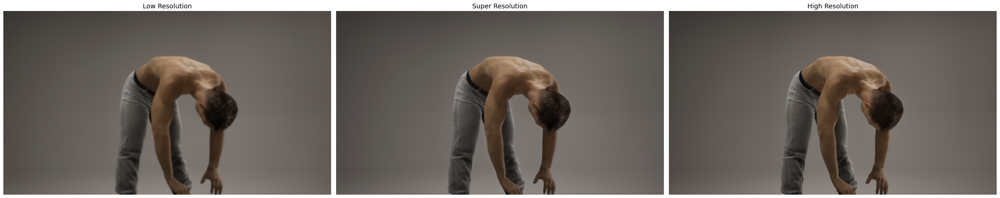

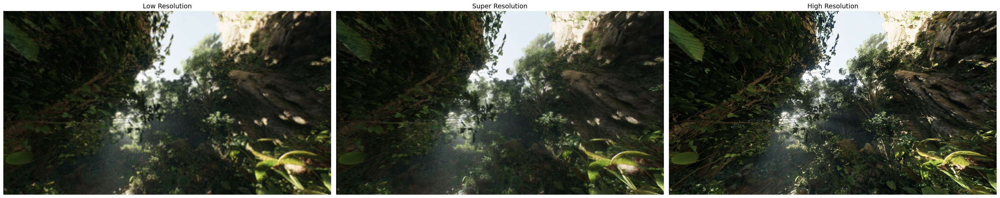

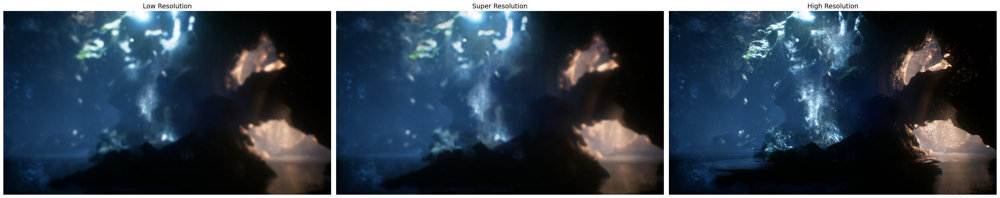

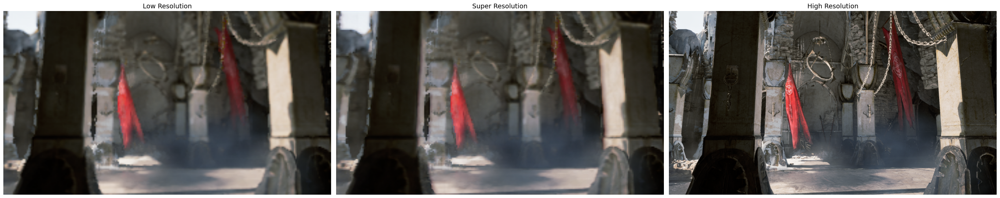

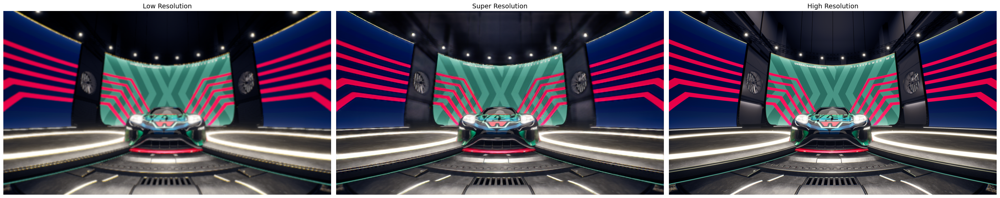

In [11]:
import matplotlib.pyplot as plt
import torch
import random

model.eval()
device = next(model.parameters()).device

num_images_to_show = 5  # number of random images to display

dataset = val_loader.dataset
dataset_size = len(dataset)

random_indices = random.sample(range(dataset_size), num_images_to_show)

with torch.no_grad():
    for idx in random_indices:
        lr, hr = dataset[idx]  # get LR, HR image tensors
        
        lr = lr.unsqueeze(0).to(device)  # add batch dim
        sr = model(lr).clamp(0, 1).cpu().squeeze(0)
        lr = lr.cpu().squeeze(0)
        
        fig, axes = plt.subplots(1, 3, figsize=(30, 10)) 
        
        axes[0].imshow(lr.permute(1, 2, 0))
        axes[0].set_title("Low Resolution", fontsize=14)
        axes[0].axis("off")
        
        axes[1].imshow(sr.permute(1, 2, 0))
        axes[1].set_title("Super Resolution", fontsize=14)
        axes[1].axis("off")
        
        axes[2].imshow(hr.permute(1, 2, 0))
        axes[2].set_title("High Resolution", fontsize=14)
        axes[2].axis("off")
        
        plt.tight_layout()
        plt.show()
